In [342]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn

import warnings
warnings.filterwarnings('ignore')

In [343]:
pip install imblearn

Note: you may need to restart the kernel to use updated packages.


In [344]:
df=pd.read_csv("WA_Fn-UseC_-HR-Employee-Attrition.csv")

In [211]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [13]:
df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


# EDA

In [139]:
df.shape

(1470, 35)

# We have 1470, rows and 35 columns in dataset

In [94]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

# we see that all the features are integers and floats.

# Checking Null values

In [95]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

# There are no NULL values in the dataset, hence it is clean.

In [149]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


# From the above, we can see that for the age min is 18 and max is 60
# EmployeeNumber, min is 1 and max is 2068.
# HourlyRate, min is 30 and max is 100 and so on.

In [152]:
df['Attrition'].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

# No of employees that stayed and left the company.
237 employees have left the company and 1233 are still in the company.

In [140]:
df['Attrition'].unique()

array(['Yes', 'No'], dtype=object)

# The no. of classes is 2

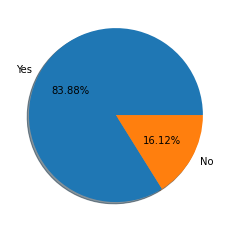

In [141]:
labels = 'Yes', 'No'

fig, ax = plt.subplots()
ax.pie(df['Attrition'].value_counts(),labels=labels, autopct='%1.2f%%', shadow=True)

plt.show()

 Out of 1470 rows, Yes = 83.88%  , No = 16.12%
 

# Univariate analysis

<AxesSubplot:xlabel='Attrition', ylabel='count'>

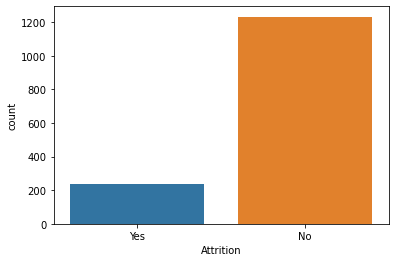

In [142]:
sn.countplot(df['Attrition'])

Yes is around 223 and No is around 1233.

# Bivariate analysis

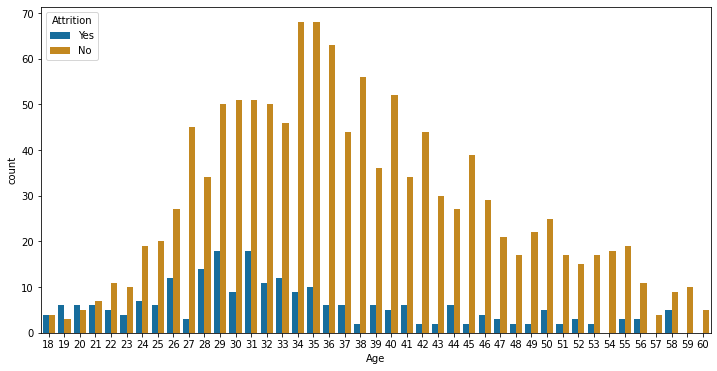

In [157]:
plt.figure(figsize=(12,6))
sn.countplot(x='Age', hue='Attrition',data=df, palette='colorblind')
plt.show()

# the number of employess that left and stayed by age.
# the employees of age 34 and 35 are currently employeed, whereas the employess of age 29 and 31 have left the company.

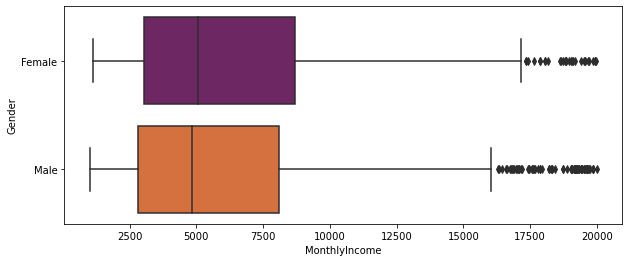

In [143]:
plt.figure(figsize=(10,4))
sn.boxplot(x ='MonthlyIncome', y ='Gender', data = df, palette = "inferno")
plt.show()

Text(0, 0.5, 'Average Monthly Income')

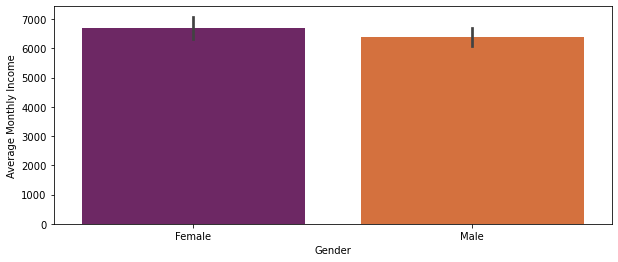

In [144]:
plt.figure(figsize=(10,4))
sn.barplot(x ='Gender', y ='MonthlyIncome', data = df, palette = "inferno")
plt.xlabel('Gender')
plt.ylabel('Average Monthly Income')

# the Montly income of Female is around 6,500 and Male is 6000.

Text(0, 0.5, 'Number of Employees')

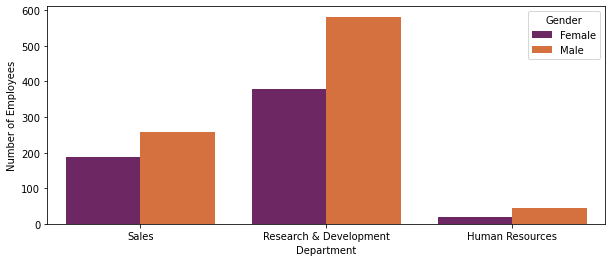

In [145]:
plt.figure(figsize=(10,4))
sn.countplot(x ='Department', hue='Gender', data = df, palette = "inferno")
plt.xlabel('Department')
plt.ylabel('Number of Employees')

# the number of employess working in Sales department ie., females are 190 and males are 250.
# the number of employess working in Research and Development department ie., females are  380 and males are 590,which is the highest.
# the number of employess working in Human Resources department is very less.

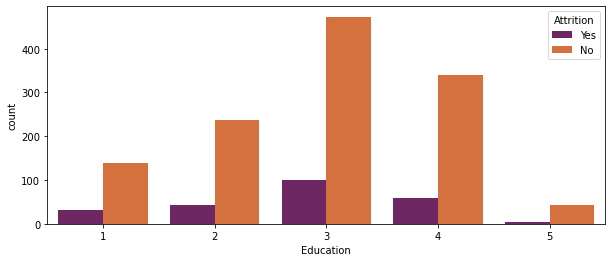

In [146]:
plt.figure(figsize=(10,4))
sn.countplot(x ='Education', hue='Attrition', data = df, palette = "inferno")
plt.show()    

Text(0, 0.5, 'Average Monthly Income')

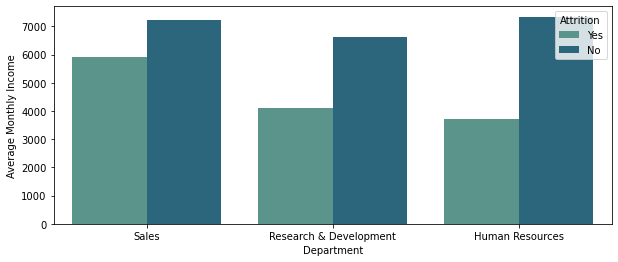

In [58]:
plt.figure(figsize=(10,4))
sn.barplot(x='Department',y='MonthlyIncome',hue='Attrition',data=df,ci=None,palette='crest')
plt.xlabel('Department')
plt.ylabel('Average Monthly Income')

Text(0, 0.5, 'Monthly Income')

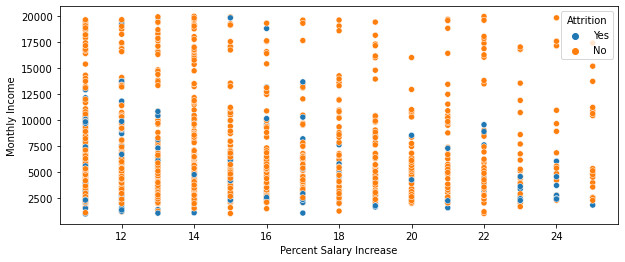

In [147]:
plt.figure(figsize=(10,4))
sn.scatterplot(x='PercentSalaryHike',y='MonthlyIncome',hue='Attrition',data=df)
plt.xlabel('Percent Salary Increase')
plt.ylabel('Monthly Income')

Text(0, 0.5, 'Attrition')

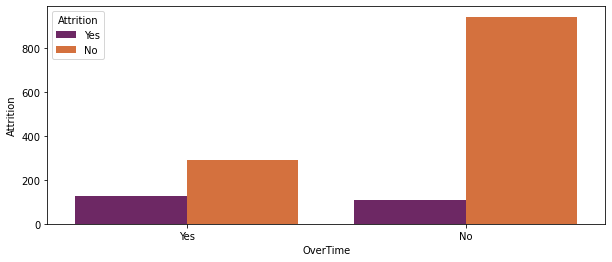

In [66]:
plt.figure(figsize=(10,4))
sn.countplot(x ='OverTime', hue='Attrition', data = df, palette = "inferno")
plt.xlabel('OverTime')
plt.ylabel('Attrition')    

Text(0, 0.5, 'Job Satisfaction')

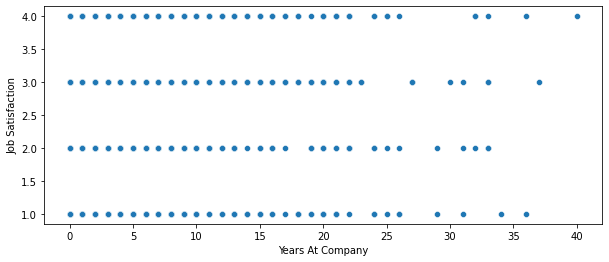

In [72]:
plt.figure(figsize=(10,4))
sn.scatterplot(x='YearsAtCompany',y='JobSatisfaction',data=df)
plt.xlabel('Years At Company')
plt.ylabel('Job Satisfaction')         

Text(0, 0.5, 'Job Satisfaction')

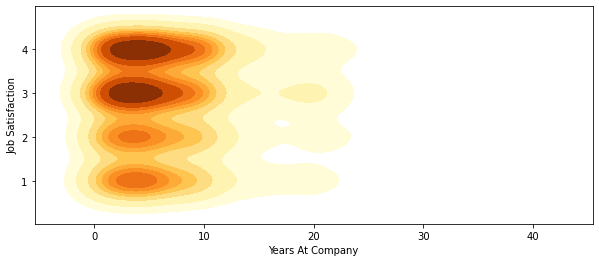

In [163]:
plt.figure(figsize=(10,4))
sn.kdeplot(x='YearsAtCompany',y='JobSatisfaction',data=df,shade=True,cmap='YlOrBr')
plt.xlabel('Years At Company')
plt.ylabel('Job Satisfaction')

# the employees working for around 5 to 8 years in the company, have more Job Satisfaction.

Text(0, 0.5, 'Attrition Rate')

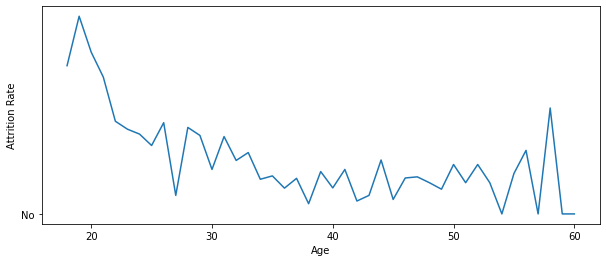

In [73]:
plt.figure(figsize=(10,4))
sn.lineplot(x='Age',y='Attrition',data=df,ci=None)
plt.xlabel('Age')
plt.ylabel('Attrition Rate')

Text(0, 0.5, 'Attrition Rate')

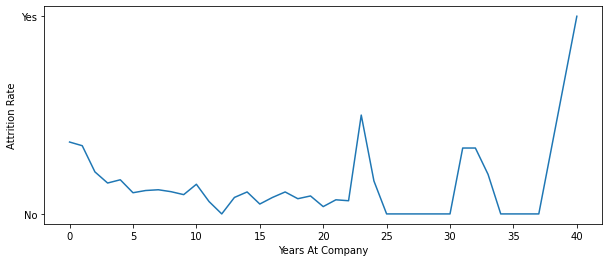

In [75]:
plt.figure(figsize=(10,4))
sn.lineplot(x='YearsAtCompany',y='Attrition',data=df,ci=None)
plt.xlabel('Years At Company')
plt.ylabel('Attrition Rate')

Text(0, 0.5, 'Attrition Rate')

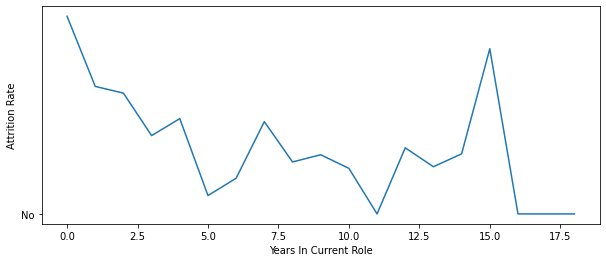

In [77]:
plt.figure(figsize=(10,4))
sn.lineplot(x='YearsInCurrentRole',y='Attrition',data=df,ci=None)
plt.xlabel('Years In Current Role')
plt.ylabel('Attrition Rate')

Text(0, 0.5, 'Attrition Rate')

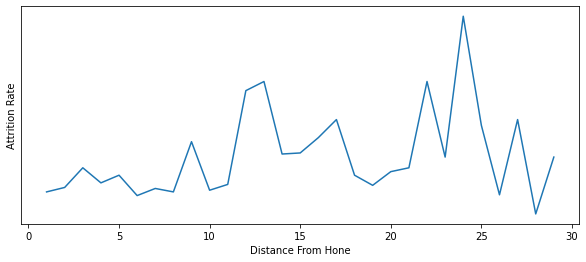

In [79]:
plt.figure(figsize=(10,4))
sn.lineplot(x='DistanceFromHome',y='Attrition',data=df,ci=None)
plt.xlabel('Distance From Hone')
plt.ylabel('Attrition Rate')

# Multivariant analysis

<Figure size 576x288 with 0 Axes>

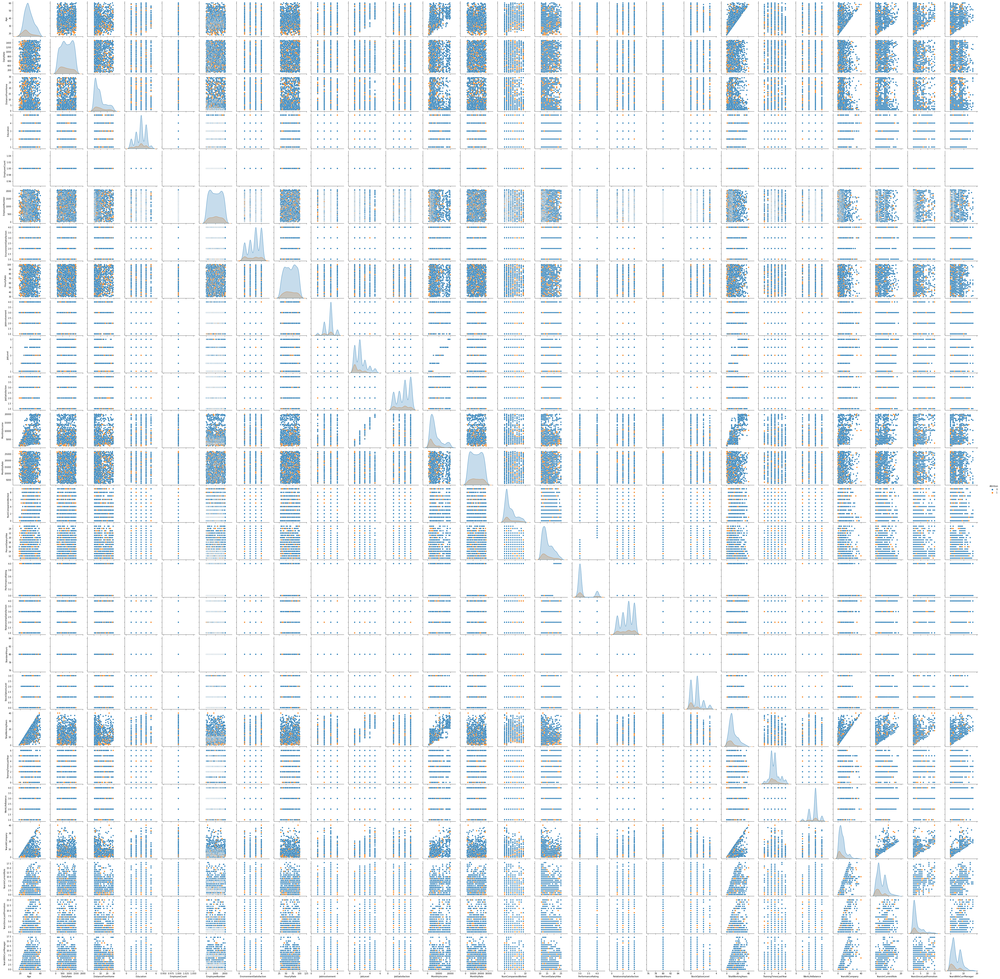

In [119]:
plt.figure(figsize=(8,4))
sn.pairplot(df,hue="Attrition")
plt.show()

# Data Cleaning

Class imbalance

In [345]:
# print all of the data types and their unique values

for column in df.columns:
    if df[column].dtype ==   object:
        print(str(column) + ' : '+ str(df[column].unique()))
        print(df[column].value_counts())
        print('--------------------------------------------------')

Attrition : ['Yes' 'No']
No     1233
Yes     237
Name: Attrition, dtype: int64
--------------------------------------------------
BusinessTravel : ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64
--------------------------------------------------
Department : ['Sales' 'Research & Development' 'Human Resources']
Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64
--------------------------------------------------
EducationField : ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64
--------------------------------------------------
Gender : ['Female' 'Male']
Male      882
Female    588
Name: Gender

Every column that is object in the dataset has values.
Also the Column Over18 has only value ie., Y object
EmployeeCount, StandardHours,
They dont bring any information to the data, so therefore removing them.

In [302]:
df['EmployeeCount'].unique()

array([1], dtype=int64)

In [274]:
df['StandardHours'].unique()

array([80], dtype=int64)

In [330]:
df['BusinessTravel'].unique()

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

In [346]:
#Removing some useless columns
df = df.drop('Over18', axis = 1)
df = df.drop('EmployeeCount', axis = 1)
df = df.drop('StandardHours', axis = 1)
df = df.drop('EmployeeNumber', axis = 1)

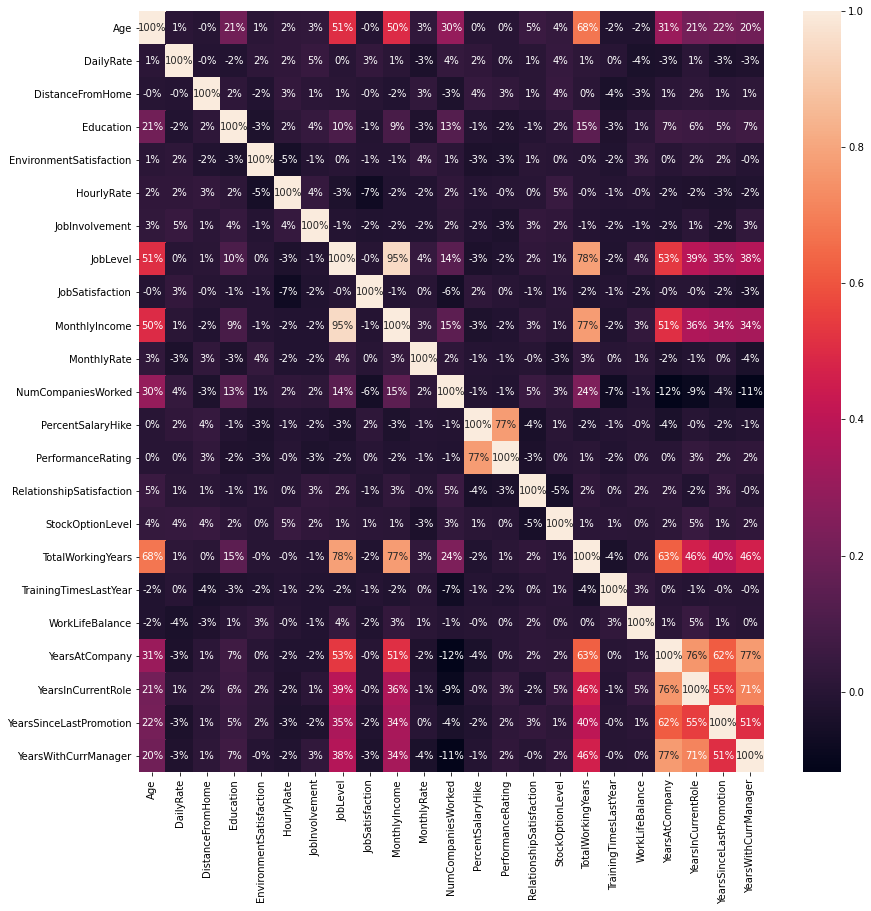

In [192]:
plt.figure(figsize=(14,14))
sn.heatmap(df.corr(), annot = True, fmt= '.0%')
plt.show()

we are creating a heatmap, to find which other features are having a good relationship with our target variable.

Age column has positive correlation with Total working years ie., the longer you work at the job the older you get.

Job level ie., 78% positive correlation with Total working years and 53% Years at the company, so the longer you work the years keep increasing as well the job level in the company.

Monthly income, again the longer you work the job level is high the income is high and so on.

In [347]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()
df = df.apply(LabelEncoder().fit_transform)

In [348]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,23,1,2,624,2,0,1,1,1,0,...,0,0,0,8,0,0,6,4,0,5
1,31,0,1,113,1,7,0,1,2,1,...,1,3,1,10,3,2,10,7,1,7
2,19,1,2,805,1,1,1,4,3,1,...,0,1,0,7,3,2,0,0,0,0
3,15,0,1,820,1,2,3,1,3,0,...,0,2,0,8,3,2,8,7,3,0
4,9,0,2,312,1,1,0,3,0,1,...,0,3,1,6,3,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,18,0,1,494,1,22,1,3,2,1,...,0,2,1,17,3,2,5,2,0,3
1466,21,0,2,327,1,5,0,3,3,1,...,0,0,1,9,5,2,7,7,1,7
1467,9,0,2,39,1,3,2,1,1,1,...,1,1,1,6,0,2,6,2,0,3
1468,31,0,1,579,2,1,2,3,3,1,...,0,3,0,17,3,1,9,6,0,8


In [349]:
#we want the first column to be the Age column so therefore we will create a new column to store Age values

df['Age_Years'] = df['Age']

In [350]:
df = df.drop('Age', axis = 1)

In [351]:
df

,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Age_Years
0,1,2,624,2,0,1,1,1,0,64,...,0,0,8,0,0,6,4,0,5,23
1,0,1,113,1,7,0,1,2,1,31,...,3,1,10,3,2,10,7,1,7,31
2,1,2,805,1,1,1,4,3,1,62,...,1,0,7,3,2,0,0,0,0,19
3,0,1,820,1,2,3,1,3,0,26,...,2,0,8,3,2,8,7,3,0,15
4,0,2,312,1,1,0,3,0,1,10,...,3,1,6,3,2,2,2,2,2,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,494,1,22,1,3,2,1,11,...,2,1,17,3,2,5,2,0,3,18
1466,0,2,327,1,5,0,3,3,1,12,...,0,1,9,5,2,7,7,1,7,21
1467,0,2,39,1,3,2,1,1,1,57,...,1,1,6,0,2,6,2,0,3,9
1468,0,1,579,2,1,2,3,3,1,33,...,3,0,17,3,1,9,6,0,8,31


# outlier analysis

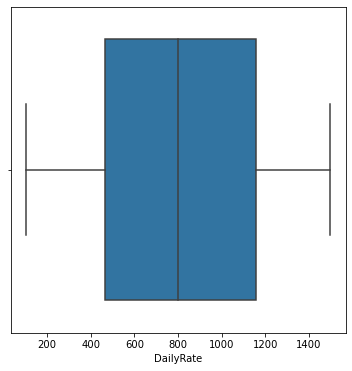

In [281]:
plt.figure(figsize=(6,6))
sn.boxplot(df["DailyRate"])
plt.show()

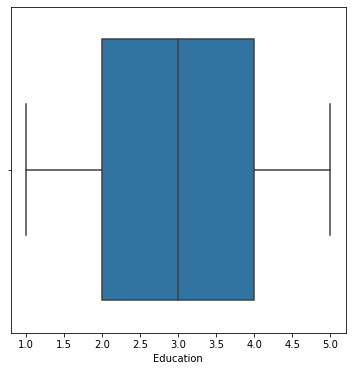

In [231]:
plt.figure(figsize=(6,6))
sn.boxplot(df["Education"])
plt.show()

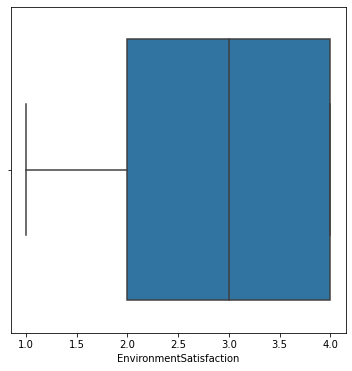

In [234]:
plt.figure(figsize=(6,6))
sn.boxplot(df["EnvironmentSatisfaction"])
plt.show()

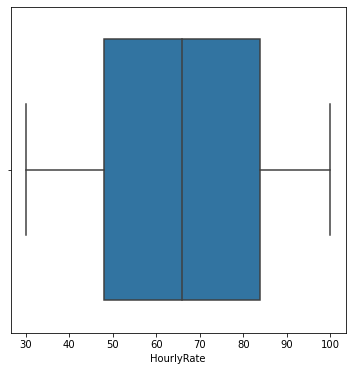

In [236]:
plt.figure(figsize=(6,6))
sn.boxplot(df["HourlyRate"])
plt.show()

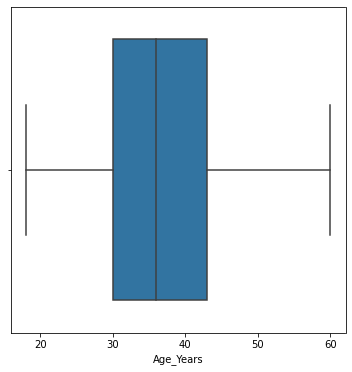

In [237]:
plt.figure(figsize=(6,6))
sn.boxplot(df["Age_Years"])
plt.show()

# There are no considerable outliers present in the data.

# To check Skewness

In [242]:
df.skew()

DailyRate                  -0.003519
DistanceFromHome            0.958118
Education                  -0.289681
EnvironmentSatisfaction    -0.321654
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobSatisfaction            -0.329672
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany              1.764529
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     1.984290
YearsWithCurrManager        0.833451
Age_Years                   0.413286
dtype: float64

Acceptable rangle for skewness value is +0.5 to -0.5.

Outside of this range is highly skew.

# Data Preprocessing

In [352]:
X = df.iloc[:, 1:df.shape[1]].values
y = df.iloc[:, 0].values

In [353]:
# splitting the data into 75% training and 25% testing

from sklearn.model_selection import train_test_split

In [354]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [401]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

In [402]:
RFC = Random ()
RFC.fit(X_train, y_train)
pred = RFC.predict(X_test)
acc=classification_report(y_test, pred)
print(acc)

              precision    recall  f1-score   support

           0       0.87      0.99      0.93       310
           1       0.76      0.22      0.35        58

    accuracy                           0.87       368
   macro avg       0.82      0.61      0.64       368
weighted avg       0.85      0.87      0.83       368



# Using Random Forest Classifier, accuracy is 87%

In [437]:
SV = SVC()
SV.fit(X_train, y_train)
pred = SV.predict(X_test)
acc=classification_report(y_test, pred)
print(acc)

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       310
           1       0.00      0.00      0.00        58

    accuracy                           0.84       368
   macro avg       0.42      0.50      0.46       368
weighted avg       0.71      0.84      0.77       368



# Using SVC, accuracy is 84%

In [404]:
DTC = DecisionTreeClassifier()
DTC.fit(X_train, y_train)
pred = DTC.predict(X_test)
acc=classification_report(y_test, pred)
print(acc)

              precision    recall  f1-score   support

           0       0.88      0.89      0.89       310
           1       0.38      0.36      0.37        58

    accuracy                           0.81       368
   macro avg       0.63      0.63      0.63       368
weighted avg       0.80      0.81      0.80       368



# Using Decision Tree Classifier, accuracy is 81%

In [406]:
#So now we are doing the cross validation

from sklearn.model_selection import cross_val_score

In [409]:
print(cross_val_score(RFC,X,y,cv=5).mean()) #RandomForest

0.8585034013605443


In [410]:
print(cross_val_score(SV,X,y,cv=5).mean()) #SVC

0.8387755102040817


In [411]:
print(cross_val_score(DTC,X,y,cv=5).mean()) #DecisionTree

0.7857142857142858


# DecisionTree

for Decison Tree Classifier, accuracy is  81%   -  78%  =  3%
for SVC, accuracy                     is  84%   -  84%  =  0% 
for Random forest Classifier, accuracy is 87%   -  86%  =  1% 

# SVC is the Best Model

In [439]:
SV = SVC()
SV.fit(X_train , y_train)
SV.score(X_train , y_train)

0.837568058076225

In [440]:
#Confusion Matrix and accuracy score for the model on the test data

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, SV.predict(X_test))

TN = cm[0][0]
TP = cm[1][1]
FN = cm[1][0]
FP = cm[0][1]

print(cm)
print('Model Testing accuracy = {}'.format( (TP + TN)/(TP + TN + FN + FP)))


[[310   0]
 [ 58   0]]
Model Testing accuracy = 0.842391304347826


In [441]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [442]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

In [443]:
probs = RFC.predict_proba(X_test)

In [444]:
probs = probs[:, 1]

In [445]:
auc = roc_auc_score(y_test, probs)
print('AUC: %.2f' % auc)

AUC: 0.77


In [446]:
fpr, tpr, thresholds = roc_curve(y_test, probs)

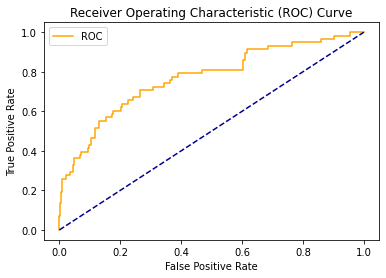

In [447]:
plot_roc_curve(fpr, tpr)

# Hyperparameter tuning

In [452]:
from sklearn.model_selection import GridSearchCV

In [454]:
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}

In [455]:
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)

In [456]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.837 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.837 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.841 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.836 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.836 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.837 total time=   0.0s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.837 total time=   0.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.841 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.836 total time=   0.0s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.836 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.837 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

In [457]:
# print best parameter after tuning
print(grid.best_params_)

{'C': 1, 'gamma': 0.0001, 'kernel': 'rbf'}


In [458]:
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)


SVC(C=1, gamma=0.0001)


In [459]:
grid_predictions = grid.predict(X_test)

In [460]:
# print classification report
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

           0       0.84      0.98      0.91       310
           1       0.17      0.02      0.03        58

    accuracy                           0.83       368
   macro avg       0.50      0.50      0.47       368
weighted avg       0.74      0.83      0.77       368



In [461]:
Final_mod = SVC()
Final_mod.fit(X_train, y_train)

SVC()

# Saving the model

In [462]:
import joblib
joblib.dump(Final_mod,"FinalModel.pkl")

['FinalModel.pkl']

# Loading the model

In [463]:
mod=joblib.load("FinalModel.pkl")

In [464]:
print(mod.predict(X_test))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [465]:
print(mod.predict(X_test).mean())

0.0
